# Centroïd and organoïd finder used by OAT

# Centroid finder

In [6]:
import pandas as pd
import numpy as np
import random
import time

## Importing centroid finding methods from OAT
from modules.utils.centroid import centroid

df = pd.read_csv(r"./data/distant_clusters.csv", index_col = 0)
df2 = pd.read_csv(r"./data/close_clusters.csv", index_col = 0)

## Creating a column to match the format that work with OAT.
coords = pd.Series([ np.array(df.loc[ID, list("xyz")].to_numpy()) for ID in df.index], index = df.index, name = "coords")
df = pd.concat([df, coords], axis = 1)

coords2 = pd.Series([ np.array(df2.loc[ID, list("xyz")].to_numpy()) for ID in df2.index], index = df2.index, name = "coords")
df2 = pd.concat([df2, coords2], axis = 1)

print("------------ 1rst Dataset : ------------")
print(df.head())
print("")
print("------------ 2nd Dataset : -------------") 
print(df2.head())

------------ 1rst Dataset : ------------
           x           y           z   tp  track  objID  target  metaObjID  \
0  50.000000  170.000000  100.000000  0.0    0.0    0.0     NaN        0.0   
1  47.914432  169.798995  101.910551  0.0    1.0    0.0     NaN        0.0   
2  50.348814  169.597990   96.025441  0.0    2.0    0.0     NaN        0.0   
3  52.965600  169.396985  103.868100  0.0    3.0    0.0     NaN        0.0   
4  44.472050  169.195980   99.022183  0.0    4.0    0.0     NaN        0.0   

                                              coords  
0                               [50.0, 170.0, 100.0]  
1  [47.91443219706017, 169.79899497487438, 101.91...  
2  [50.34881428871151, 169.59798994974875, 96.025...  
3  [52.96559965571984, 169.39698492462313, 103.86...  
4  [44.47205005697247, 169.1959798994975, 99.0221...  

------------ 2nd Dataset : -------------
          x          y         z   tp  track  objID  target  metaObjID  \
0  0.000000  25.000000  0.000000  0.0    0.0

## Vizualizing the dataset

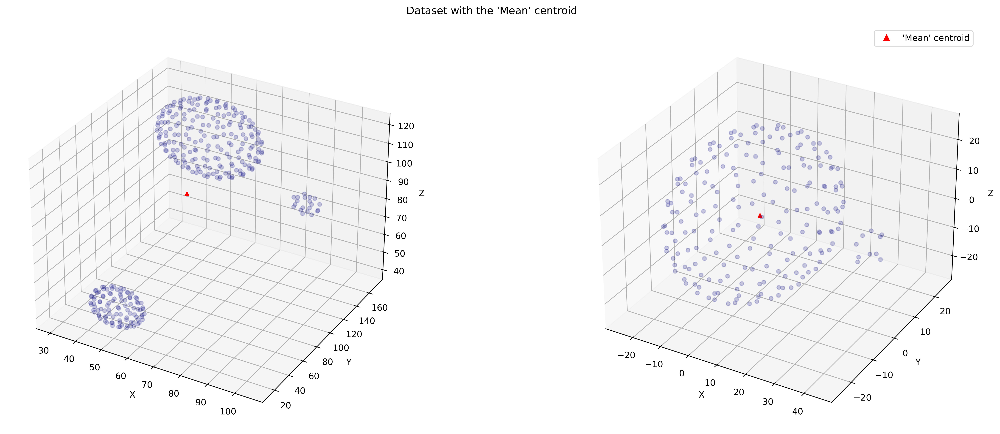

In [7]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 121, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');
ax2 = fig.add_subplot( 122, projection='3d' ); ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z');

## Plotting all data
ax1.scatter(df["x"], df["y"], df["z"], color = "navy", alpha = 0.2)
ax2.scatter(df2["x"], df2["y"], df2["z"], color = "navy", alpha = 0.2)

## Computing the "raw" centroid
raw_cent_coord = centroid.compute_mean_centroid(df, "coords")
raw_cent_coord2 = centroid.compute_mean_centroid(df2, "coords")

## Plotting the "raw" centroid
ax1.scatter(raw_cent_coord[0], raw_cent_coord[1], raw_cent_coord[2], color = "red", marker = "^")
ax2.scatter(raw_cent_coord2[0], raw_cent_coord2[1], raw_cent_coord2[2], color = "red", marker = "^")

## Adding the legend
legend = [Line2D([0], [0], marker = "^", color = "red", label = "'Mean' centroid", markersize = 7, ls = '')]
plt.legend(handles = legend, loc = 'best')

fig.suptitle("Dataset with the 'Mean' centroid")
plt.tight_layout()

plt.show()

# Using gradients slope
The goal is to find the centroid of the organoïd. But as seen on the figure above, segmenting the organoïd only can be difficult and lead to some noise in the form of small cell blobs or parts of another organoïd.

In this part, we will use the gradient slope to lean towards the sum minima.

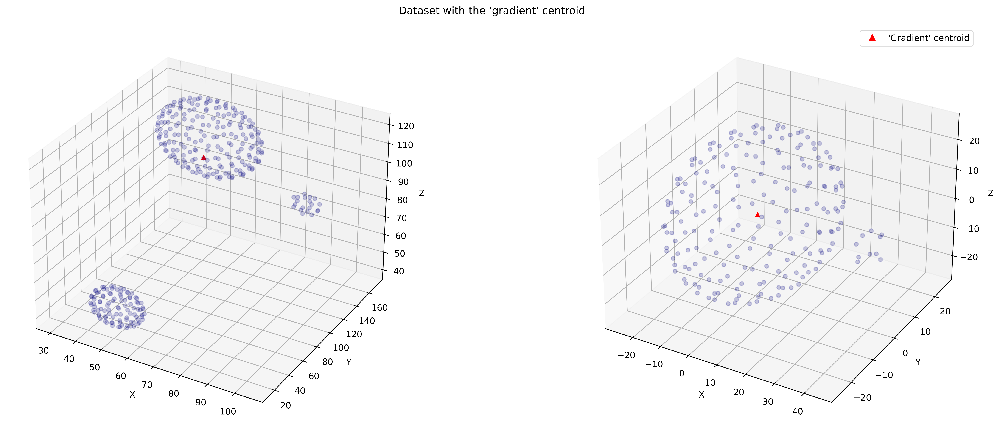

In [8]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 121, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');
ax2 = fig.add_subplot( 122, projection='3d' ); ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z');

## Plotting all data
ax1.scatter(df["x"], df["y"], df["z"], color = "navy", alpha = 0.2)
ax2.scatter(df2["x"], df2["y"], df2["z"], color = "navy", alpha = 0.2)

## Computing the "gradient" centroid
grad_cent_coord = centroid.compute_gradient_centroid(df, "coords")
grad_cent_coord2 = centroid.compute_gradient_centroid(df2, "coords")

## Plotting the "gradient" centroid
ax1.scatter(grad_cent_coord[0], grad_cent_coord[1], grad_cent_coord[2], color = "red", marker = "^")
ax2.scatter(grad_cent_coord2[0], grad_cent_coord2[1], grad_cent_coord2[2], color = "red", marker = "^")

## Adding the legend
legend = [Line2D([0], [0], marker = "^", color = "red", label = "'Gradient' centroid", markersize = 7, ls = '')]
plt.legend(handles = legend, loc = 'best')

fig.suptitle("Dataset with the 'gradient' centroid")
plt.tight_layout()

plt.show()

# Using a random subsampling of the dataset

Another way of getting the centroïd is to get random subsample of the dataset and compute the centroïd out of these. In the end, we can select the median centroid.

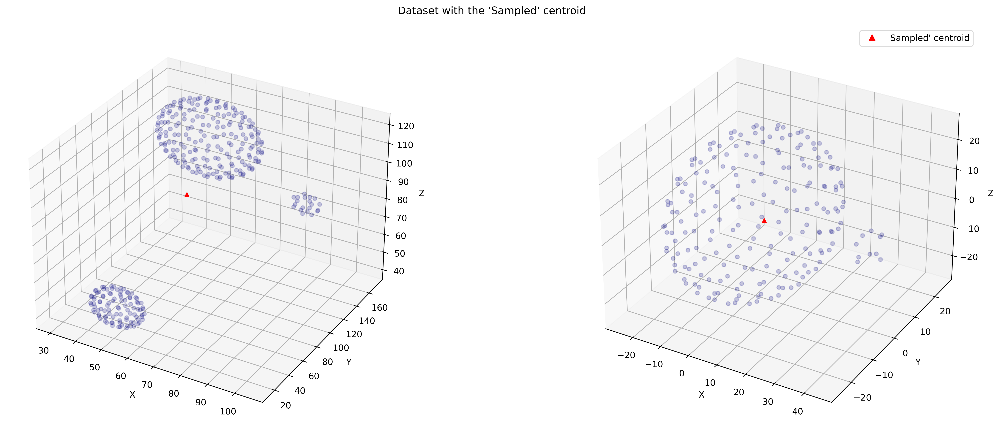

In [9]:
fig = plt.figure( figsize=(20,7), dpi = 400 )

ax1 = fig.add_subplot( 121, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');
ax2 = fig.add_subplot( 122, projection='3d' ); ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z');

## Plotting all data
ax1.scatter(df["x"], df["y"], df["z"], color = "navy", alpha = 0.2)
ax2.scatter(df2["x"], df2["y"], df2["z"], color = "navy", alpha = 0.2)

## Computing the "sampled" a centroid
rng_cent_coord = centroid.compute_sampled_centroid(df, "coords")
rng_cent_coord2 = centroid.compute_sampled_centroid(df2, "coords")

## Plotting the "sampled" centroid
ax1.scatter(rng_cent_coord[0], rng_cent_coord[1], rng_cent_coord[2], color = "red", marker = "^")
ax2.scatter(rng_cent_coord2[0], rng_cent_coord2[1], rng_cent_coord2[2], color = "red", marker = "^")

## Adding the legend
legend = [Line2D([0], [0], marker = "^", color = "red", label = "'Sampled' centroid", markersize = 7, ls = '')]
plt.legend(handles = legend, loc = 'best')

fig.suptitle("Dataset with the 'Sampled' centroid")
plt.tight_layout()

plt.show()

# Comparing results

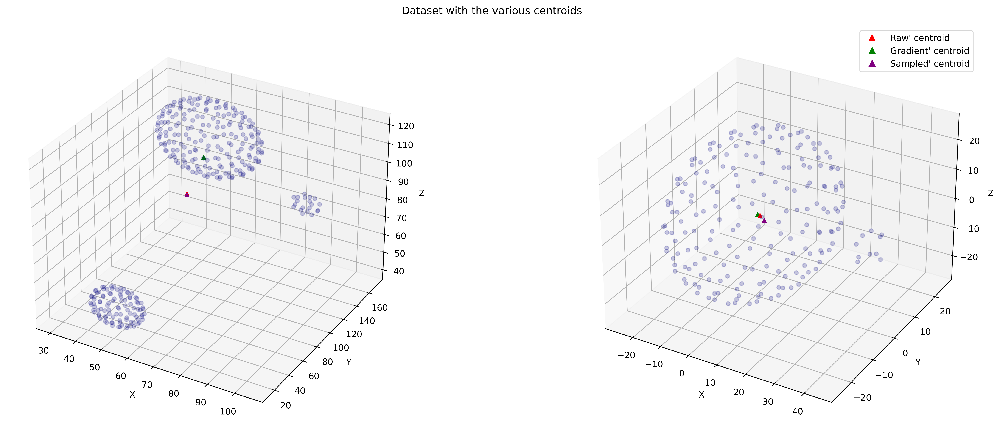

In [10]:
fig = plt.figure( figsize=(20,7), dpi = 400 )



ax1 = fig.add_subplot( 121, projection='3d' ); ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z');
ax2 = fig.add_subplot( 122, projection='3d' ); ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z');

## Plotting all data
ax1.scatter(df["x"], df["y"], df["z"], color = "navy", alpha = 0.2)
ax2.scatter(df2["x"], df2["y"], df2["z"], color = "navy", alpha = 0.2)


## Plotting centroids
ax1.scatter(raw_cent_coord[0], raw_cent_coord[1], raw_cent_coord[2], color = "red", marker = "^")
ax2.scatter(raw_cent_coord2[0], raw_cent_coord2[1], raw_cent_coord2[2], color = "red", marker = "^")
ax1.scatter(grad_cent_coord[0], grad_cent_coord[1], grad_cent_coord[2], color = "green", marker = "^")
ax2.scatter(grad_cent_coord2[0], grad_cent_coord2[1], grad_cent_coord2[2], color = "green", marker = "^")
ax1.scatter(rng_cent_coord[0], rng_cent_coord[1], rng_cent_coord[2], color = "purple", marker = "^")
ax2.scatter(rng_cent_coord2[0], rng_cent_coord2[1], rng_cent_coord2[2], color = "purple", marker = "^")

## Adding legends
legend = []
legend.append( Line2D([0], [0], marker = "^", color = "red", label = "'Raw' centroid", markersize = 7, ls = '') )
legend.append( Line2D([0], [0], marker = "^", color = "green", label = "'Gradient' centroid", markersize = 7, ls = '') )
legend.append( Line2D([0], [0], marker = "^", color = "purple", label = "'Sampled' centroid", markersize = 7, ls = '') )
plt.legend(handles = legend, loc = 'best')

fig.suptitle("Dataset with the various centroids")
plt.tight_layout()

plt.show()

On both datasets, the gradient method make sure that we get a centroid within the organoïd.